# Introduction : Taxi Fare Prediction
## Objective
The objective of New York taxi fare prediction is to develop a model that accurately predicts the fare amount for taxi rides specifically in the context of New York City. The primary goal is to estimate the fare cost based on various input features related to New York taxi trips

# Data Dictionary
The dataset contains several columns with information about taxi service.The detailed data dictionary is given below :

- 'User ID': A unique identifier for each user.
- 'User Name': The name of the user.
- 'Driver Name': The name of the taxi driver.
- 'Car Condition': The condition of the taxi car.
- 'Weather': Information about the weather conditions during the trip.
- 'Traffic Condition': Information about the traffic conditions during the trip.
- 'key': A unique identifier for each trip.
- 'fare_amount': The fare amount charged for the trip.
- 'pickup_datetime': The date and time when the trip started.
- 'pickup_longitude': The longitude coordinate of the pickup location.
- 'pickup_latitude': The latitude coordinate of the pickup location.
- 'dropoff_longitude': The longitude coordinate of the dropoff location.
- 'dropoff_latitude': The latitude coordinate of the dropoff location.
- 'passenger_count': The number of passengers in the taxi.
- 'hour': The hour of the day when the trip started.
- 'day': The day of the month when the trip started.
- 'month': The month when the trip started.
- 'weekday': The day of the week when the trip started.
- 'year': The year when the trip started.
- 'jfk_dist': The distance from the pickup location to John F. Kennedy International Airport.
- 'ewr_dist': The distance from the pickup location to Newark Liberty International Airport.
- 'lga_dist': The distance from the pickup location to LaGuardia Airport.
- 'sol_dist': The distance from the pickup location to Statue of Liberty.
- 'nyc_dist': The distance from the pickup location to the center of New York City.
- 'distance': The total distance of the trip.
- 'bearing' : The direction of travel from the pickup point to the dropoff point.


## 'fare_amount'
- Description: The fare amount charged for the trip.

- Role: This is the dependent variable or the target variable that the model will predict based on the various input features provided in the dataset.


## Type of Problem
The New York taxi fare prediction problem is a regression problem. In machine learning, regression problems involve predicting a continuous target variable based on one or more input features. In this case, the target variable is the fare_amount, which is a continuous numerical value representing the fare charged for each taxi trip.

## Import the LIB

In [1]:
import numpy as np
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns

import math

import warnings
warnings.filterwarnings('ignore')

In [2]:
data= pd.read_csv("final_internship_data.csv")

## Data Exploration

In [3]:
data

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,KHVrEVlD,Kimberly Adams,Amy Butler,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-1.288826,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,lPxIuEri,Justin Tapia,Hannah Zimmerman,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-1.291824,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,gsVN8JLS,Elizabeth Lopez,Amanda Jackson,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-1.291242,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,9I7kWFgd,Steven Wilson,Amy Horn,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-1.291319,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,8QN5ZaGN,Alexander Andrews,Cassandra Larson,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-1.290987,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,er7Luy6J,Morgan Smith,Gabriel Coleman,Bad,rainy,Dense Traffic,2015-05-07 18:45:12.0000004,7.0,2015-05-07 18:45:12,-1.291173,...,5,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706
499996,FWDZu9NA,Dillon Jackson,Larry Richards,Very Good,rainy,Flow Traffic,2010-09-13 12:11:34.0000004,13.7,2010-09-13 12:11:34,-1.291595,...,9,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931
499997,QZIMcpLZ,Michael Rodriguez,Lonnie Santana,Bad,rainy,Flow Traffic,2014-08-25 00:22:20.0000001,25.0,2014-08-25 00:22:20,-1.291262,...,8,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251
499998,AD72Uwmn,Deborah Soto,Emily Rivera,Good,stormy,Congested Traffic,2015-01-12 12:17:32.0000001,6.5,2015-01-12 12:17:32,-1.291101,...,1,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 26 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   User ID            500000 non-null  object 
 1   User Name          500000 non-null  object 
 2   Driver Name        500000 non-null  object 
 3   Car Condition      500000 non-null  object 
 4   Weather            500000 non-null  object 
 5   Traffic Condition  500000 non-null  object 
 6   key                500000 non-null  object 
 7   fare_amount        500000 non-null  float64
 8   pickup_datetime    500000 non-null  object 
 9   pickup_longitude   500000 non-null  float64
 10  pickup_latitude    500000 non-null  float64
 11  dropoff_longitude  499995 non-null  float64
 12  dropoff_latitude   499995 non-null  float64
 13  passenger_count    500000 non-null  int64  
 14  hour               500000 non-null  int64  
 15  day                500000 non-null  int64  
 16  mo

In [5]:
data.columns

Index(['User ID', 'User Name', 'Driver Name', 'Car Condition', 'Weather',
       'Traffic Condition', 'key', 'fare_amount', 'pickup_datetime',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'hour', 'day', 'month',
       'weekday', 'year', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist',
       'nyc_dist', 'distance', 'bearing'],
      dtype='object')

In [6]:
data.shape

(500000, 26)

In [7]:
data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
count,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000
mean,11.358361,-1.265712,0.696740,-1.265755,0.696675,1.683428,13.510834,15.684206,6.268650,3.042008,2011.739132,385.279367,380.503657,363.843772,363.674038,355.991423,19.468775,0.297145
std,9.916617,0.206941,0.140909,0.205903,0.128997,1.307395,6.511571,8.681066,3.437815,1.949240,1.860889,2419.087483,2428.804740,2425.075903,2428.348683,2428.730839,367.299601,1.804548
min,-44.900000,-52.119764,-54.389440,-59.049665,-44.676047,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.460945,0.382119,0.532545,0.080500,0.000000,-3.141593
25%,6.000000,-1.291405,0.710958,-1.291393,0.710943,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.341514,32.173712,17.100762,14.886989,7.147384,1.214550,-0.854721
50%,8.500000,-1.291226,0.711268,-1.291197,0.711277,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.523163,34.787507,19.591554,18.347580,10.458151,2.116970,-0.050442
75%,12.500000,-1.290970,0.711520,-1.290908,0.711538,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.785649,38.304502,22.214815,22.417812,14.448699,3.890070,2.206769
max,500.000000,37.360538,29.724576,0.712985,7.061893,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,30133.067880,30167.595967,30167.285794,30159.407296,30162.285356,12399.956433,3.141593


##  Addressing  & Handling Misleading Data


In [8]:
data['fare_amount'].describe()


count    500000.000000
mean         11.358361
std           9.916617
min         -44.900000
25%           6.000000
50%           8.500000
75%          12.500000
max         500.000000
Name: fare_amount, dtype: float64

In [9]:
from collections import Counter
Counter(data['fare_amount']<0)

Counter({False: 499979, True: 21})

In [10]:
data = data.drop(data[data['fare_amount']<0].index, axis=0)
data.shape

(499979, 26)

In [11]:
data['fare_amount'].describe()

count    499979.000000
mean         11.359104
std           9.915980
min           0.000000
25%           6.000000
50%           8.500000
75%          12.500000
max         500.000000
Name: fare_amount, dtype: float64

In [12]:
data['passenger_count'].describe()

count    499979.000000
mean          1.683423
std           1.307388
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           6.000000
Name: passenger_count, dtype: float64

In [13]:
Counter(data['passenger_count'] == 0)

Counter({False: 498183, True: 1796})

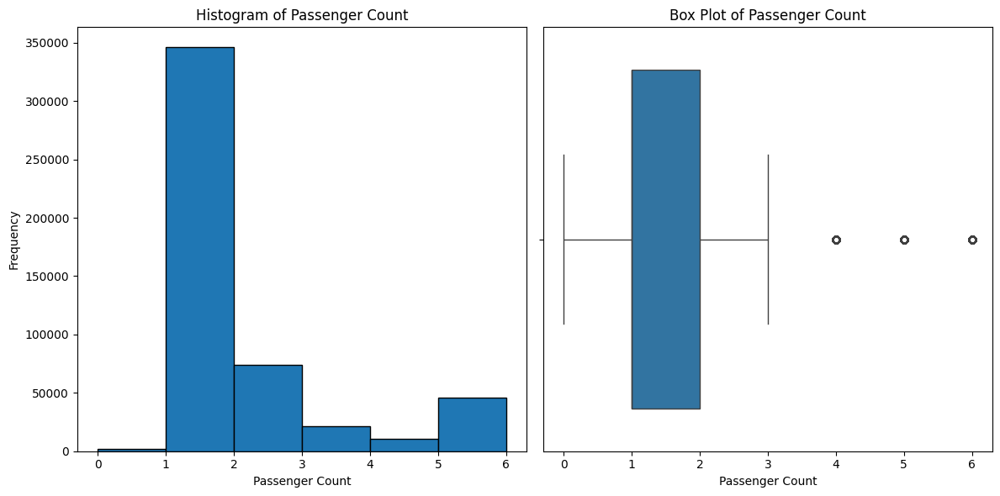

In [14]:
# histogram of passenger_count
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(data['passenger_count'].dropna(), bins=range(int(data['passenger_count'].min()), int(data['passenger_count'].max()) + 1), edgecolor='black')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.title('Histogram of Passenger Count')

# box plot of passenger_count
plt.subplot(1, 2, 2)
sns.boxplot(x=data['passenger_count'])
plt.xlabel('Passenger Count')
plt.title('Box Plot of Passenger Count')

plt.tight_layout()
plt.show()

In [15]:
print(data[data['passenger_count'] == 0].shape)

(1796, 26)


In [16]:
zero_passenger_df = data[data['passenger_count'] == 0]
zero_passenger_df.head()

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
314,kjLpJXoE,Sean Smith,Eric Hull,Very Good,rainy,Congested Traffic,2015-06-02 23:16:15.00000012,34.0,2015-06-02 23:16:15,-1.291106,...,6,1,2015,49.707029,47.954794,21.112890,33.333532,25.275227,15.577567,-0.366230
566,RANpOJe8,Melissa Delgado,Mary Cruz,Good,stormy,Dense Traffic,2012-01-28 21:33:18.0000002,4.9,2012-01-28 21:33:18,-1.290764,...,1,5,2012,42.857164,40.662335,14.007863,24.844038,16.635168,1.020108,3.102373
678,BGhf6Pn3,Mary Rogers,Kathryn Sheppard,Bad,windy,Flow Traffic,2012-02-27 07:24:20.0000003,6.5,2012-02-27 07:24:20,-1.291254,...,2,0,2012,41.315595,34.561818,18.882275,17.320243,8.997916,2.426752,-0.429661
1160,KlmfDSIH,Christine Carlson,Christopher Burton,Bad,rainy,Flow Traffic,2011-05-25 23:58:48.0000001,13.3,2011-05-25 23:58:48,-1.291515,...,5,2,2011,42.449216,36.264752,17.576321,19.708428,11.640352,6.003251,-0.815443
1935,T4TWzmKd,Veronica Allen,Samantha Mitchell,Very Good,sunny,Congested Traffic,2011-10-23 11:09:28.0000001,10.1,2011-10-23 11:09:28,-1.291044,...,10,6,2011,45.122314,39.058836,16.629750,24.215571,16.325672,2.950300,-3.041521


In [17]:
zero_passenger_df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
count,1796.000000,1796.000000,1796.000000,1791.000000,1791.000000,1796.0,1796.000000,1796.000000,1796.000000,1796.000000,1796.000000,1791.000000,1791.000000,1791.000000,1791.000000,1791.000000,1791.000000,1791.000000
mean,9.021019,-1.268867,0.698977,-1.270205,0.699742,0.0,13.658129,15.950445,5.785635,3.030067,2011.364143,326.254172,320.795270,304.495294,304.010091,296.254093,75.354461,0.332435
std,6.544207,0.168208,0.092661,0.163002,0.089797,0.0,6.301527,8.643821,3.545209,1.944978,0.573243,2049.458404,2058.230436,2054.749642,2057.741919,2058.045804,789.605833,1.804466
min,2.500000,-1.292102,0.000000,-1.292102,0.000000,0.0,0.000000,1.000000,1.000000,0.000000,2010.000000,1.307249,24.521904,1.032025,6.167113,0.663467,0.000000,-3.139423
25%,5.300000,-1.291402,0.710972,-1.291397,0.710952,0.0,9.000000,9.000000,3.000000,1.000000,2011.000000,41.494353,32.048464,17.073064,14.662101,7.016253,1.169465,-0.811395
50%,7.300000,-1.291228,0.711283,-1.291198,0.711279,0.0,14.000000,16.000000,5.000000,3.000000,2011.000000,42.625312,34.608888,19.611399,18.134522,10.222211,2.004750,-0.128576
75%,10.500000,-1.290986,0.711527,-1.290912,0.711555,0.0,19.000000,23.000000,9.000000,5.000000,2012.000000,43.954768,38.185654,22.235425,22.273387,14.226819,3.508806,2.304968
max,89.250000,0.000000,0.713306,0.000000,0.715684,0.0,23.000000,31.000000,12.000000,6.000000,2015.000000,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,8667.388437,3.141593


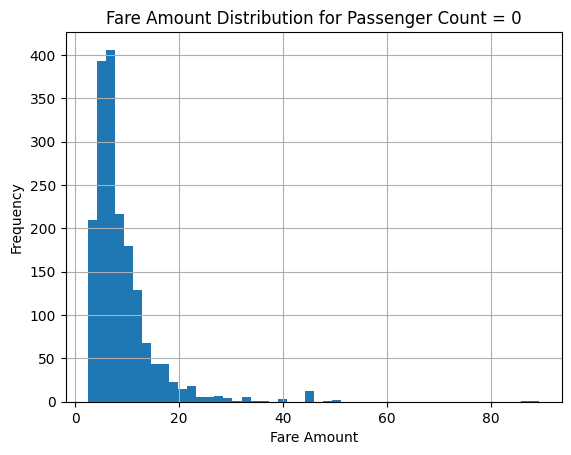

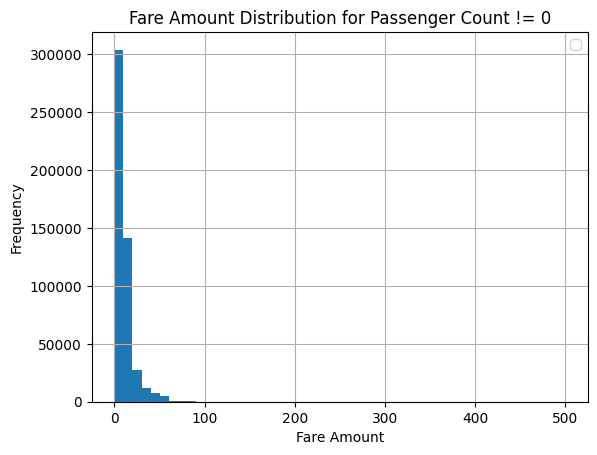

In [18]:
zero_passenger_df['fare_amount'].hist(bins=50)
plt.title('Fare Amount Distribution for Passenger Count = 0')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.show()

non_zero_passenger_df = data[data['passenger_count'] > 0]
non_zero_passenger_df['fare_amount'].hist(bins=50)
plt.legend()
plt.title('Fare Amount Distribution for Passenger Count != 0')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.show()

In [19]:
correlation_zero_passenger = zero_passenger_df.corr(numeric_only = True)
print(correlation_zero_passenger['fare_amount'].sort_values(ascending=False))

fare_amount          1.000000
distance             0.057459
year                 0.045643
day                  0.031456
hour                 0.029802
pickup_longitude     0.014227
nyc_dist             0.009094
ewr_dist             0.009050
sol_dist             0.008938
lga_dist             0.008670
jfk_dist             0.007572
month                0.000835
weekday              0.000423
dropoff_latitude     0.000198
dropoff_longitude    0.000089
pickup_latitude     -0.014326
bearing             -0.050272
passenger_count           NaN
Name: fare_amount, dtype: float64


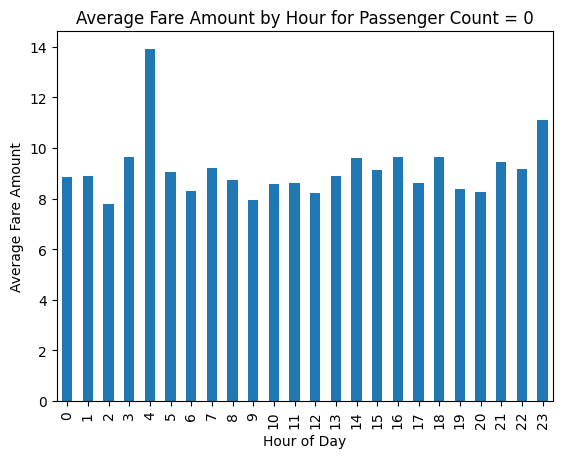

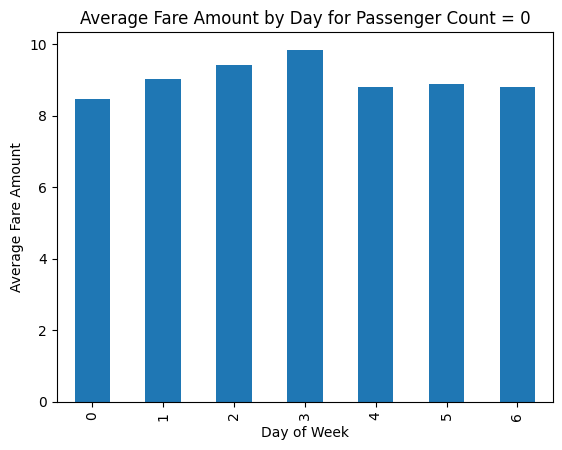

In [20]:
hourly_distribution = zero_passenger_df.groupby('hour')['fare_amount'].mean()
hourly_distribution.plot(kind='bar')
plt.title('Average Fare Amount by Hour for Passenger Count = 0')
plt.xlabel('Hour of Day')
plt.ylabel('Average Fare Amount')
plt.show()

daily_distribution = zero_passenger_df.groupby('weekday')['fare_amount'].mean()
daily_distribution.plot(kind='bar')
plt.title('Average Fare Amount by Day for Passenger Count = 0')
plt.xlabel('Day of Week')
plt.ylabel('Average Fare Amount')
plt.show()

AS Passenger count include outliers and most Values between 1-3 , using the median is an effective method

In [21]:
# Calculate the median
median_passenger_count = data.loc[data['passenger_count'] > 0, 'passenger_count'].median()

# Replace 0 values with the median
data['passenger_count'] = data['passenger_count'].replace(0, median_passenger_count)


In [22]:
# # Replace passenger_count with 1 if it is 0
# data['passenger_count'] = data['passenger_count'].replace(0, 1)

In [23]:
# Define valid ranges for latitude and longitude
valid_latitude_range = (-90, 90)
valid_longitude_range = (-180, 180)

# Create boolean masks for valid coordinates
valid_pickup_longitude_mask = data['pickup_longitude'].between(*valid_longitude_range)
valid_pickup_latitude_mask = data['pickup_latitude'].between(*valid_latitude_range)
valid_dropoff_longitude_mask = data['dropoff_longitude'].between(*valid_longitude_range)
valid_dropoff_latitude_mask = data['dropoff_latitude'].between(*valid_latitude_range)

# Combine masks to identify valid rows
valid_pickup_coordinates_mask = valid_pickup_longitude_mask & valid_pickup_latitude_mask
valid_dropoff_coordinates_mask = valid_dropoff_longitude_mask & valid_dropoff_latitude_mask

# Combine masks to get rows with valid coordinates
valid_coordinates_mask = valid_pickup_coordinates_mask & valid_dropoff_coordinates_mask

df_valid = data[valid_coordinates_mask]

# Count rows with invalid coordinates
original_count = len(data)
valid_count = len(df_valid)
invalid_count = original_count - valid_count

print(f"Number of rows with invalid coordinates: {invalid_count}")

 # Filter out rows with invalid coordinates

data = data[valid_coordinates_mask]

Number of rows with invalid coordinates: 5


In [24]:
data.duplicated().sum()

0

## print the Unique values in each column

In [25]:
for column in data.columns:
    unique_values = data[column].unique()

    print("\033[92m" + f"Unique values in column '{column}':" + "\033[0m")

    print(unique_values)
    print()

Unique values in column 'User ID':
['KHVrEVlD' 'lPxIuEri' 'gsVN8JLS' ... 'QZIMcpLZ' 'AD72Uwmn' 'qGKn4Um5']

Unique values in column 'User Name':
['Kimberly Adams' 'Justin Tapia' 'Elizabeth Lopez' ... 'Monique Wade'
 'Wanda Parks' 'Dillon Jackson']

Unique values in column 'Driver Name':
['Amy Butler' 'Hannah Zimmerman' 'Amanda Jackson' ... 'Gabriel Coleman'
 'Larry Richards' 'Lonnie Santana']

Unique values in column 'Car Condition':
['Very Good' 'Excellent' 'Bad' 'Good']

Unique values in column 'Weather':
['windy' 'cloudy' 'stormy' 'sunny' 'rainy']

Unique values in column 'Traffic Condition':
['Congested Traffic' 'Flow Traffic' 'Dense Traffic']

Unique values in column 'key':
['2009-06-15 17:26:21.0000001' '2010-01-05 16:52:16.0000002'
 '2011-08-18 00:35:00.00000049' ... '2014-08-25 00:22:20.0000001'
 '2015-01-12 12:17:32.0000001' '2010-04-12 23:46:58.0000002']

Unique values in column 'fare_amount':
[ 4.5  16.9   5.7  ... 45.58 70.75 71.7 ]

Unique values in column 'pickup_datetime

# Data Cleansing

In [26]:
data= data.drop(columns=['User ID', 'User Name','Driver Name'])

In [27]:
data.duplicated().sum()

0

In [28]:
# 1. Convert 'pickup_datetime' to datetime
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'], errors='coerce')


In [29]:
data.isnull().sum()

Car Condition        0
Weather              0
Traffic Condition    0
key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
passenger_count      0
hour                 0
day                  0
month                0
weekday              0
year                 0
jfk_dist             0
ewr_dist             0
lga_dist             0
sol_dist             0
nyc_dist             0
distance             0
bearing              0
dtype: int64

In [30]:
# Select numerical columns
numerical_data = data.select_dtypes(include='number')

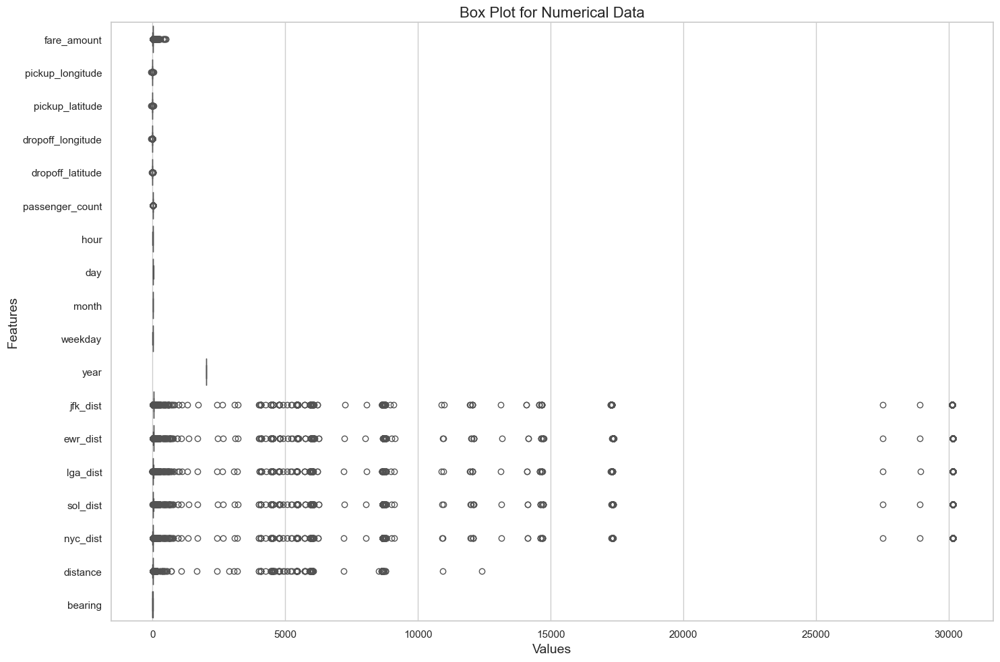

(499974, 23)

In [31]:
# Set up the aesthetics for the plot
sns.set(style="whitegrid")

# Create a color palette
palette = sns.color_palette("coolwarm", len(data.columns))

# Create the box plots for every numerical variable
plt.figure(figsize=(15, 10))


# Plotting
sns.boxplot(data=numerical_data, orient="h", palette=palette)
plt.title("Box Plot for Numerical Data", fontsize=16)
plt.xlabel("Values", fontsize=14)
plt.ylabel("Features", fontsize=14)

plt.tight_layout()
plt.show()

# Print the shape of the data
data.shape


In [32]:
handled_columns=['fare_amount', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist', 'nyc_dist', 'distance']
# function to Handle outliers based on IQR

def handle_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # Cap the outliers
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# handle outliers
data = handle_outliers(data, handled_columns)

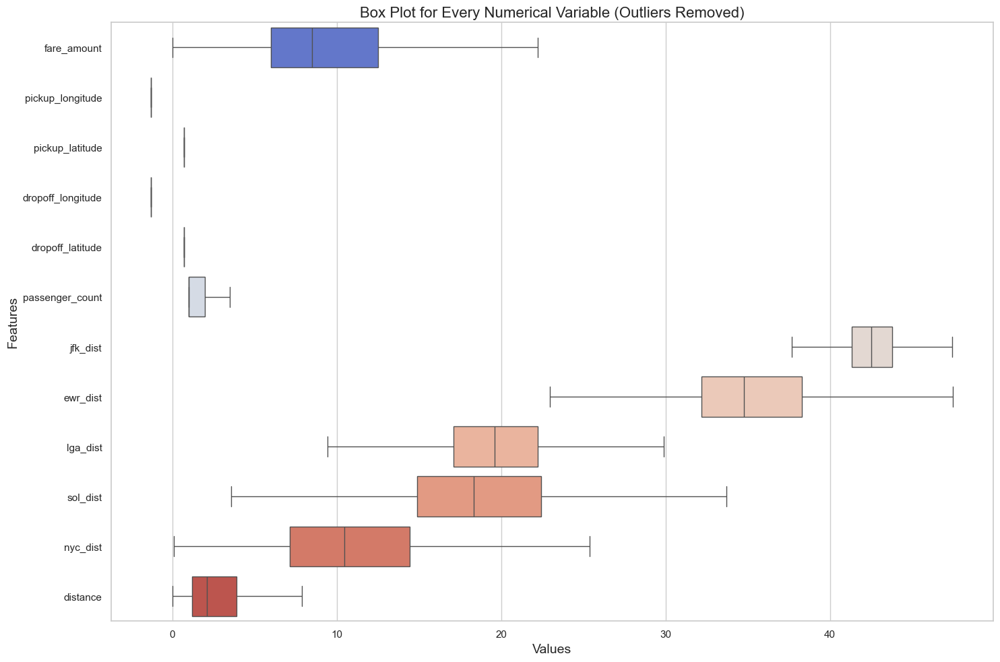

(499974, 23)


In [33]:
# Create the box plots for the cleaned numerical variables
plt.figure(figsize=(15, 10))

# Plotting
palette = sns.color_palette("coolwarm", len(handled_columns))
sns.boxplot(data=data[handled_columns], orient="h", palette=palette)
plt.title("Box Plot for Every Numerical Variable (Outliers Removed)", fontsize=16)
plt.xlabel("Values", fontsize=14)
plt.ylabel("Features", fontsize=14)

plt.tight_layout()

# Show the plot
plt.show()

# Print the shape of the cleaned data
print(data.shape)

**Analyzing Continuous Variables**

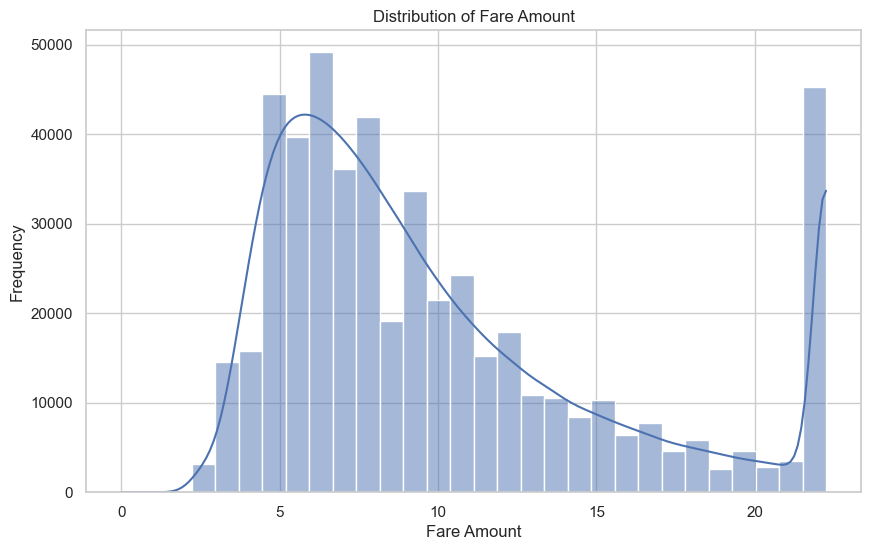

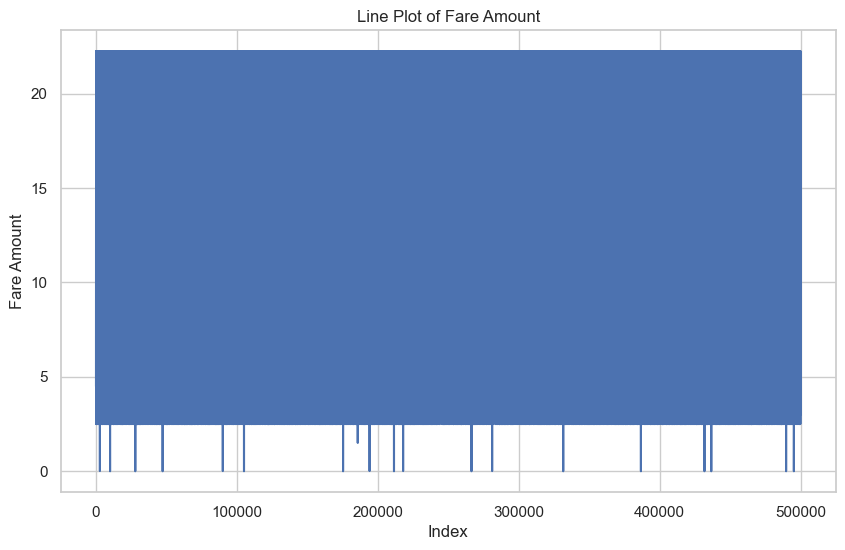

In [34]:
import pandas as pd


##Histogram

import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for fare amount
plt.figure(figsize=(10, 6))
sns.histplot(data['fare_amount'], bins=30, kde=True)
plt.title('Distribution of Fare Amount')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.show()


print("")

##Line Plot

# Line plot for fare amount
plt.figure(figsize=(10, 6))
data['fare_amount'].plot(kind='line')
plt.title('Line Plot of Fare Amount')
plt.xlabel('Index')
plt.ylabel('Fare Amount')
plt.show()

**Analyzing Categorical Variables**


**Passenger Count**

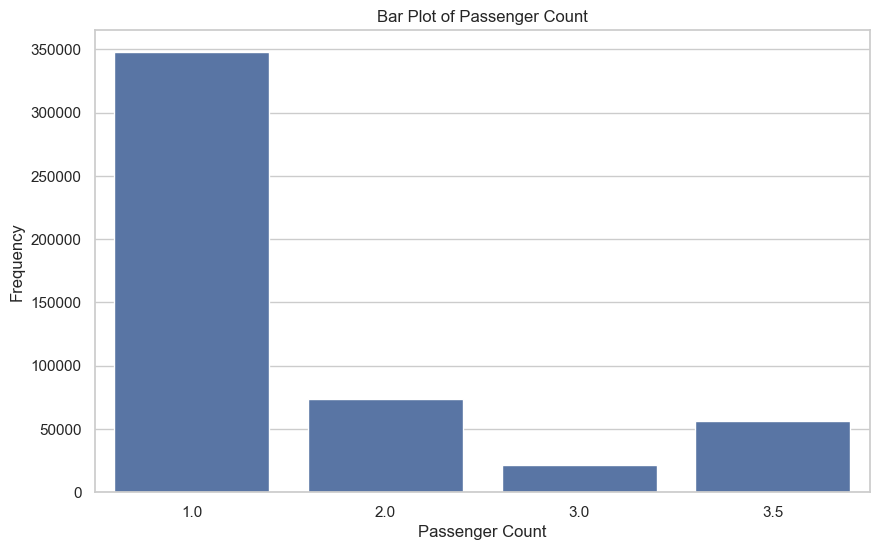

In [35]:
##Bar Plot

# Bar plot for passenger count
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='passenger_count')
plt.title('Bar Plot of Passenger Count')
plt.xlabel('Passenger Count')
plt.ylabel('Frequency')
plt.show()

**Car Condition**

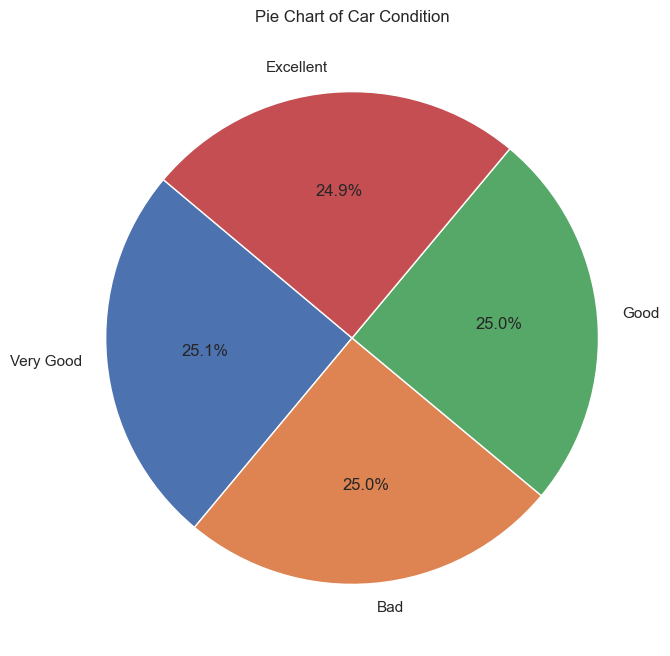

In [36]:
# Pie chart for Car Condition
Car_Condition_distribution = data['Car Condition'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Car_Condition_distribution, labels=Car_Condition_distribution.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Car Condition')
plt.show()

**Weather**

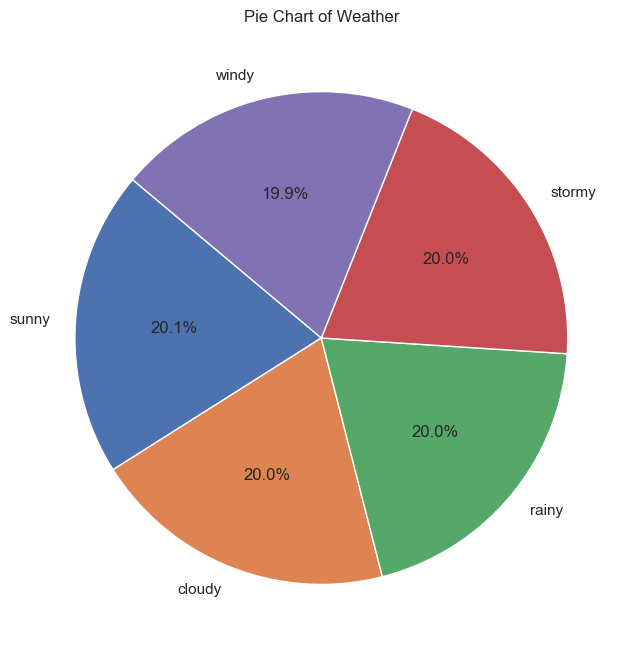

In [37]:
##Pie Chart

# Pie chart for Weather
Weather_distribution = data['Weather'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Weather_distribution, labels= Weather_distribution.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Weather')
plt.show()

**Traffic Condition**

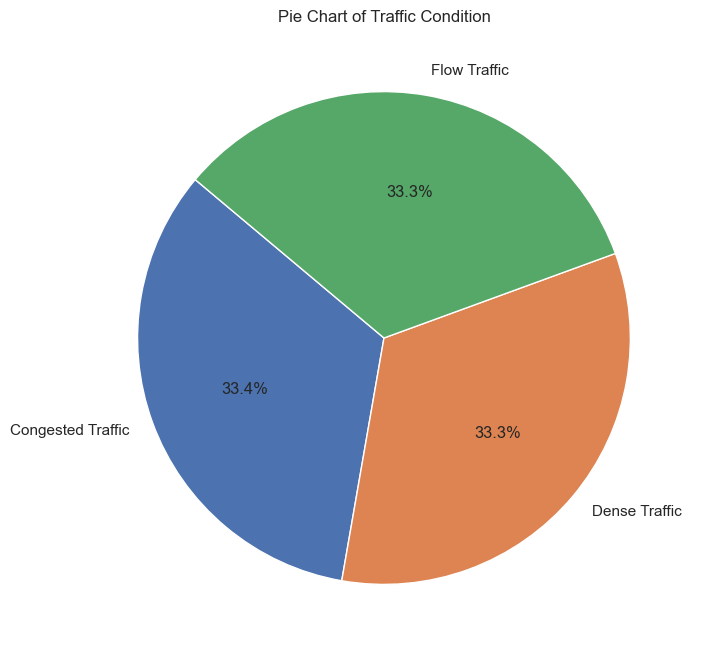

(499974, 23)


In [38]:
##Pie Chart

# Pie chart for Traffic Condition
Traffic_Condition_distribution = data['Traffic Condition'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(Traffic_Condition_distribution, labels= Traffic_Condition_distribution.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Traffic Condition')
plt.show()

print(data.shape)

**# Numerical columns**

In [39]:
numerical_columns = ['fare_amount','pickup_latitude','pickup_longitude',
                     'dropoff_longitude','dropoff_latitude', 
                     'passenger_count', 'jfk_dist', 
                     'ewr_dist', 'lga_dist', 'sol_dist', 
                     'nyc_dist', 'distance', 'bearing', 
                     'hour', 'day', 'month', 'weekday', 'year']

# **Plotting histograms and density plots for numerical columns**

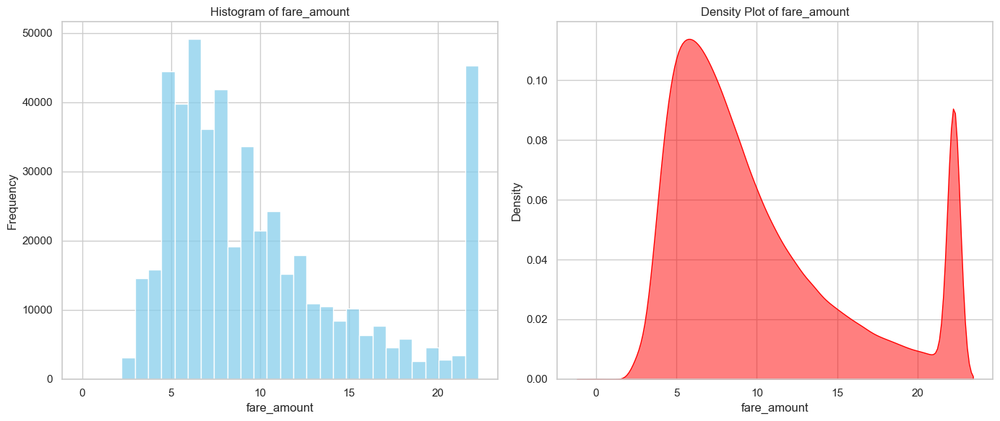

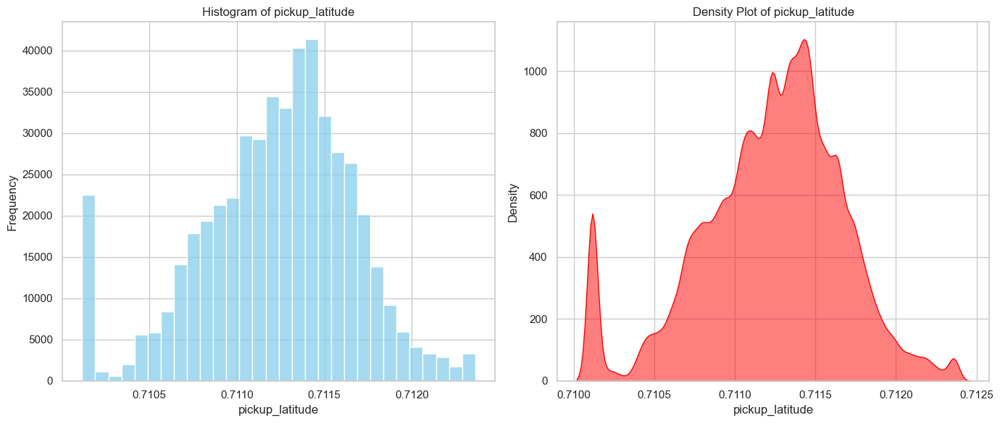

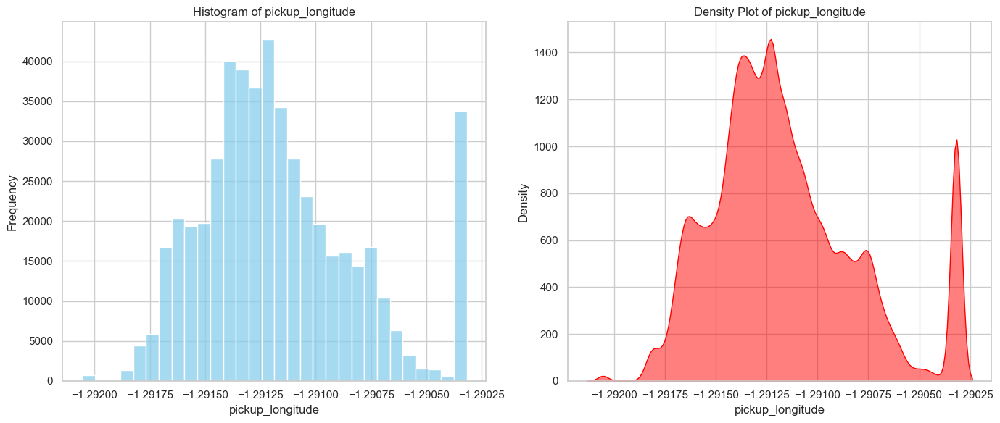

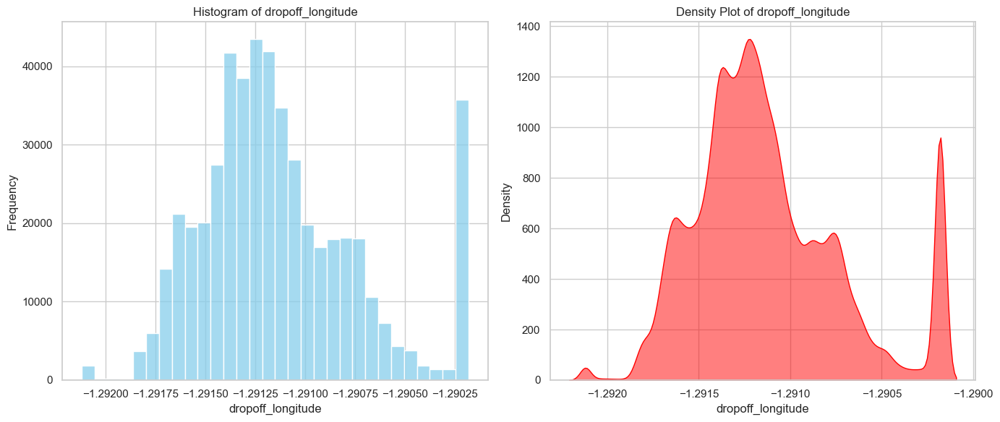

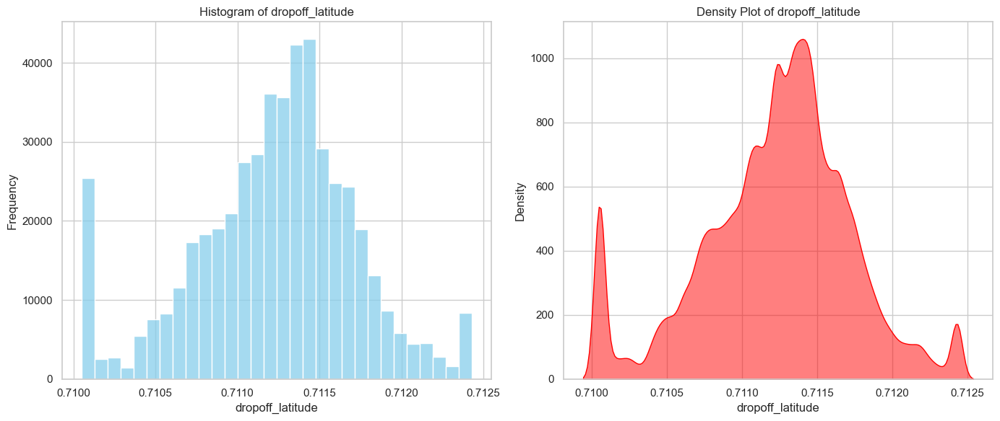

...

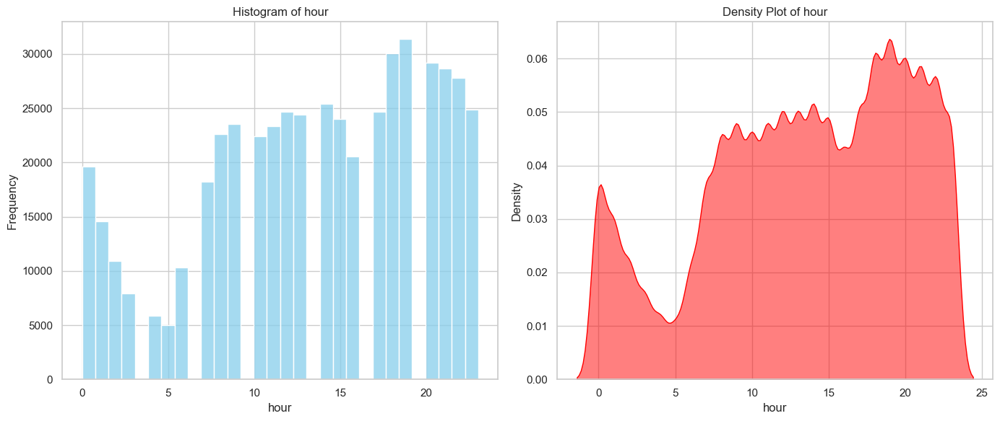

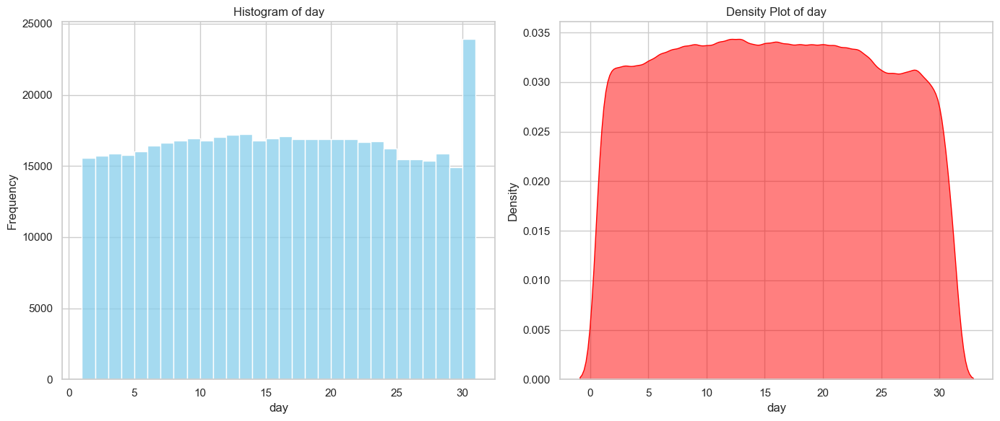

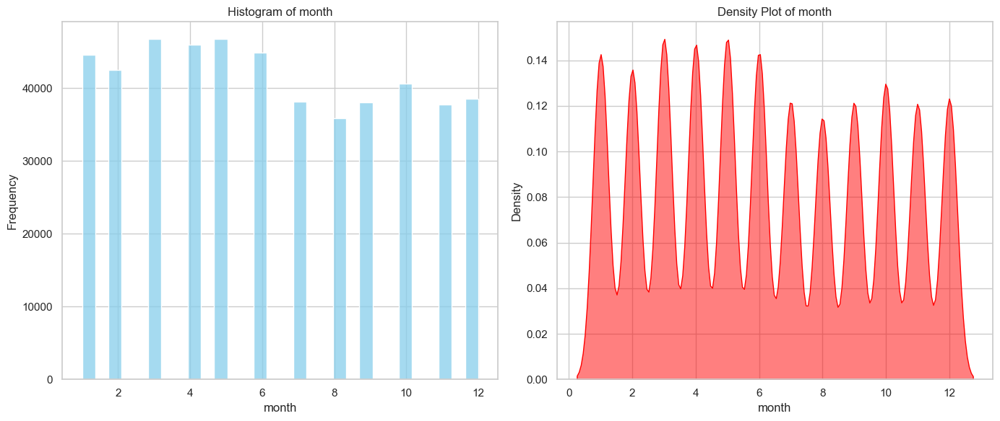

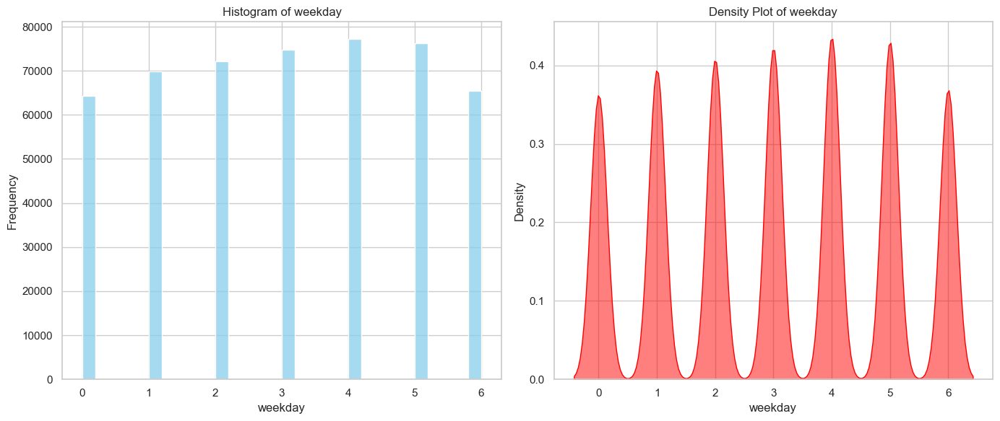

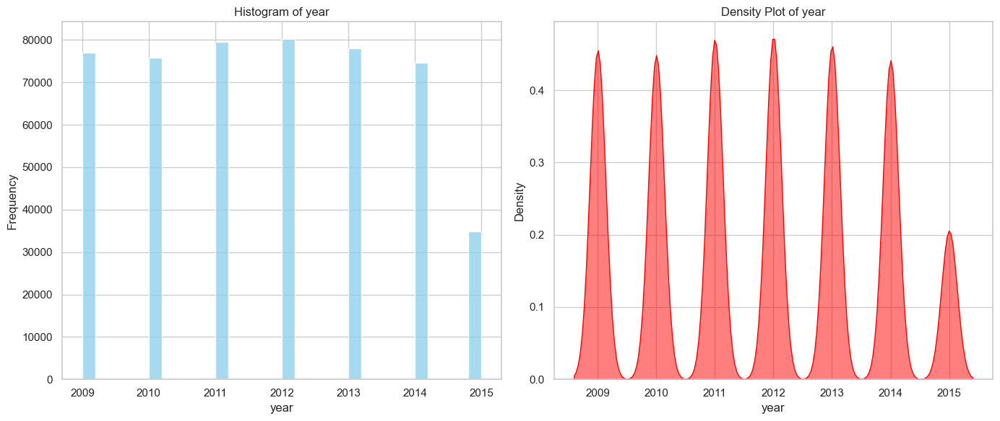

In [40]:
def plot_histograms_and_density(data, columns):
    for column in columns:
        plt.figure(figsize=(14, 6))
        
        # Histogram
        plt.subplot(1, 2, 1)
        sns.histplot(data[column], bins=30, kde=False, color='skyblue')
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        
        # Density Plot
        plt.subplot(1, 2, 2)
        sns.kdeplot(data[column], fill=True, color='red', alpha=0.5)
        plt.title(f'Density Plot of {column}')
        plt.xlabel(column)
        plt.ylabel('Density')
        
        plt.tight_layout()
        plt.show()
 # Call the function to generate plots
plot_histograms_and_density(data, numerical_columns)

**Display the first few rows for time colums **

In [41]:
# Extract relevant columns
time_columns_data = data[['hour', 'day', 'month', 'weekday', 'year', 'fare_amount']]

# Display the first few rows
time_columns_data.head()

,hour,day,month,weekday,year,fare_amount
0,17,15,6,0,2009,4.5
1,16,5,1,1,2010,16.9
2,0,18,8,3,2011,5.7
3,4,21,4,5,2012,7.7
4,7,9,3,1,2010,5.3


**line plots for each time-based column, examining the average fare_amount over time.**

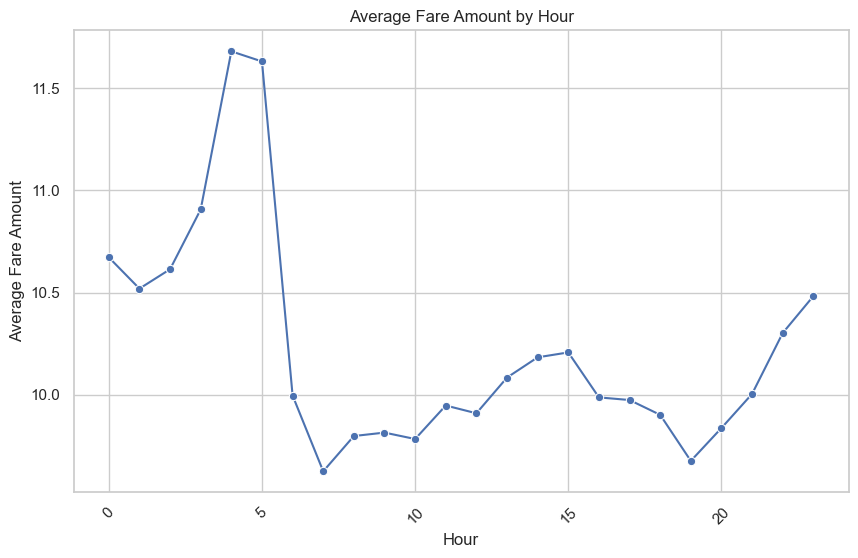

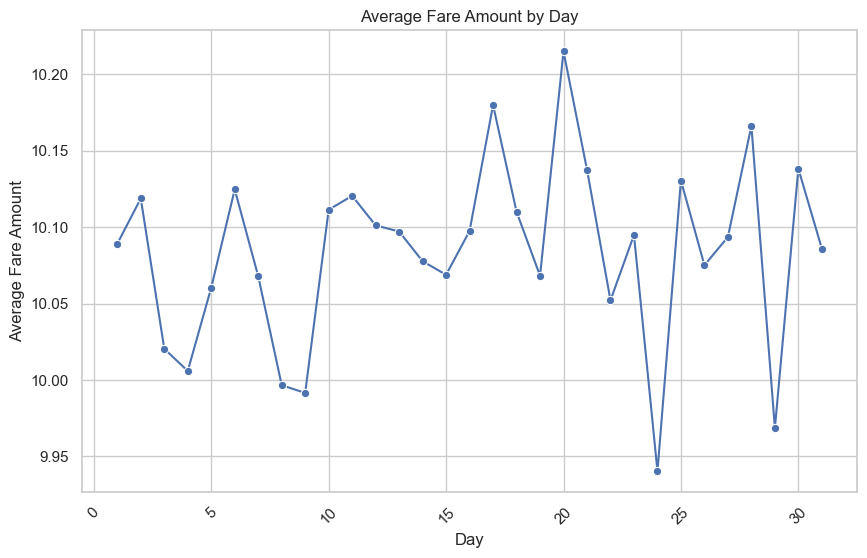

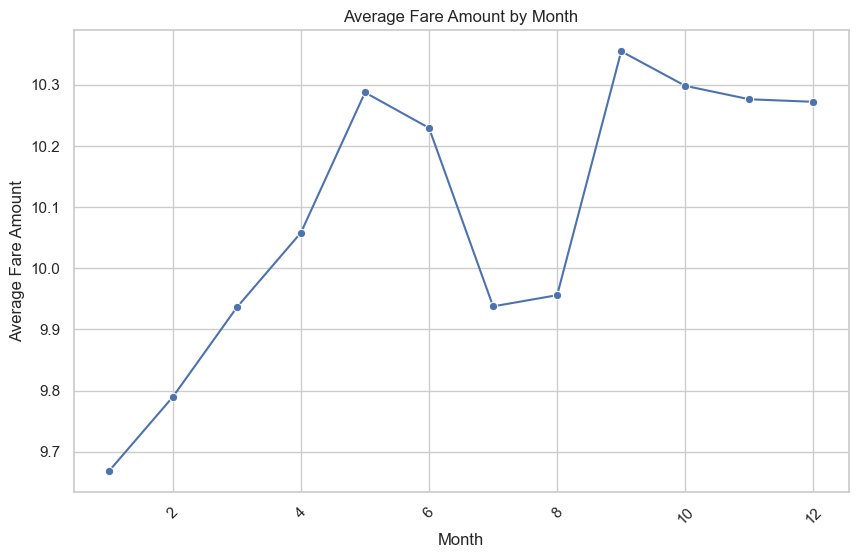

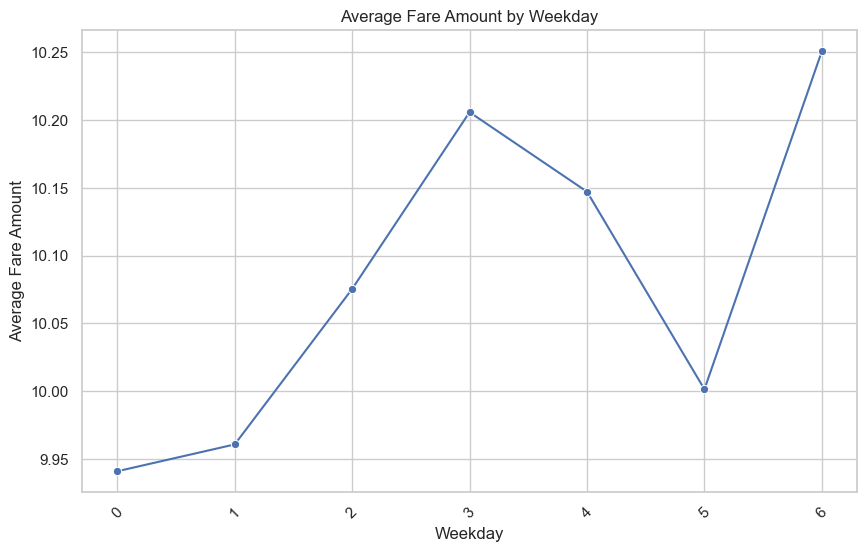

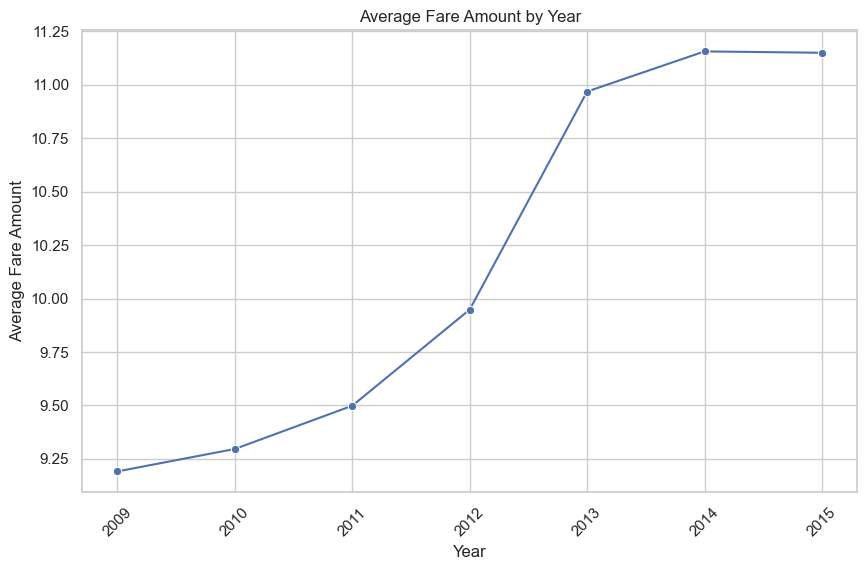

In [42]:
# Set plot style
sns.set(style='whitegrid')

# Function to create line plots for each time-based column
def plot_time_based_line_plots(data):
    time_columns = ['hour', 'day', 'month', 'weekday', 'year']
    
    for column in time_columns:
        plt.figure(figsize=(10, 6))
        
        # Group by the current time-based column and calculate the mean fare_amount
        mean_fare = data.groupby(column)['fare_amount'].mean().reset_index()

        # Line plot for the current time-based column
        sns.lineplot(x=column, y='fare_amount', data=mean_fare, marker='o')

        # Add titles and labels
        plt.title(f'Average Fare Amount by {column.capitalize()}')
        plt.xlabel(column.capitalize())
        plt.ylabel('Average Fare Amount')
        plt.xticks(rotation=45)
        
        # Show the plot
        plt.show()

# Create line plots
plot_time_based_line_plots(time_columns_data)


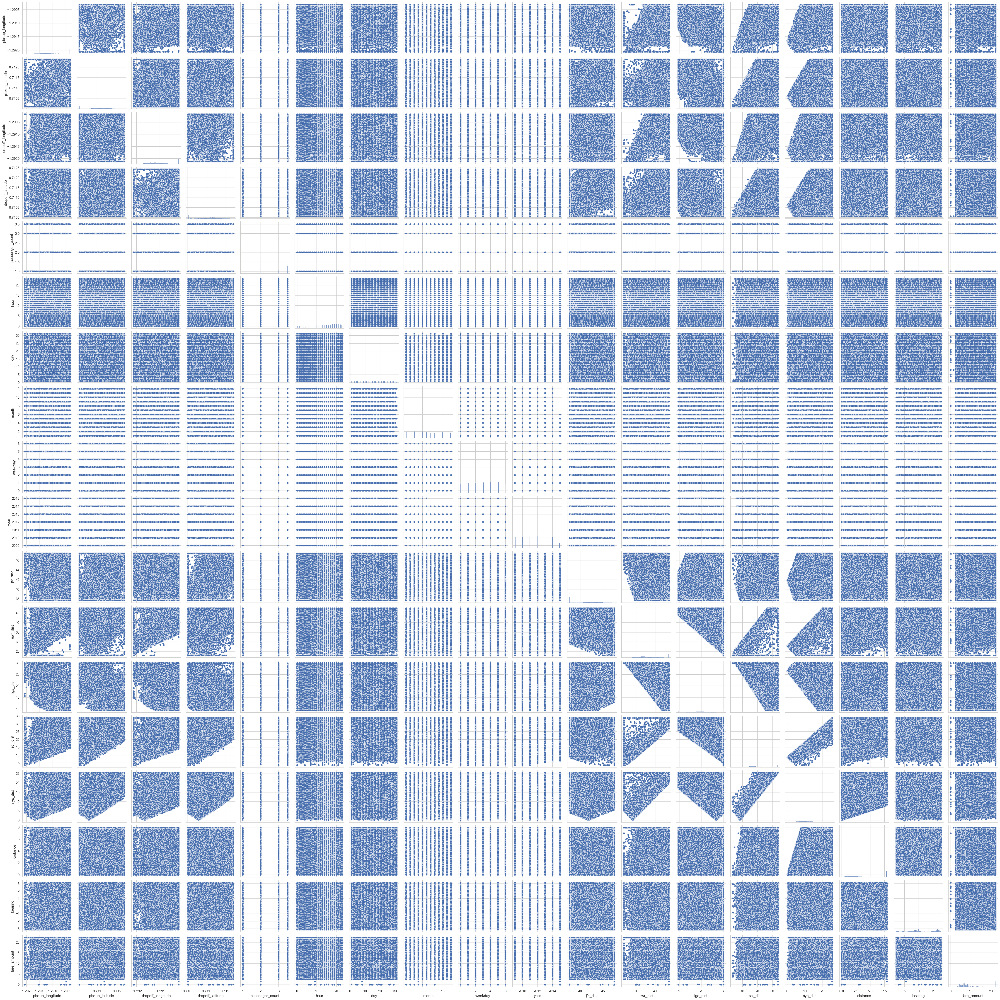

In [43]:
numeric_columns = data.select_dtypes(include=[np.number]).columns

selected_columns = [col for col in numeric_columns if col != 'fare_amount']
selected_columns.append('fare_amount')

sns.pairplot(data[selected_columns])
plt.show()

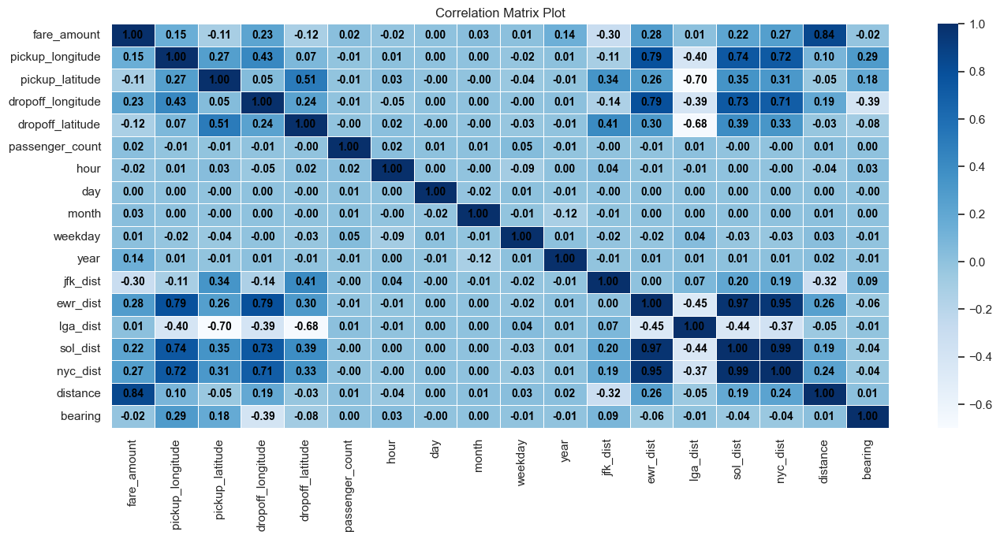

In [44]:
numeric_df = data.select_dtypes(include=[np.number])
corr_matrix = numeric_df.corr()

plt.figure(figsize=(14, 7))
sns.heatmap(corr_matrix, annot=True, cmap="Blues", linewidths=0.5, fmt=".2f", annot_kws={"size": 10, "weight": "bold", "color": "black"})
plt.title('Correlation Matrix Plot')
plt.tight_layout()
plt.show()

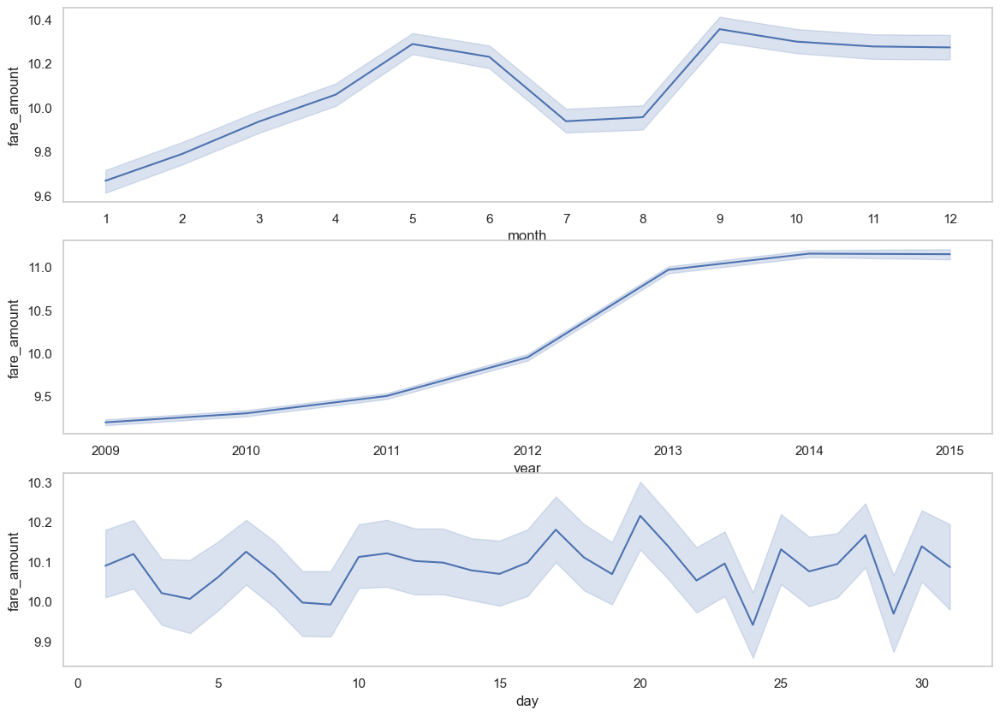

In [45]:
plt.figure(figsize=(14,10))

# chart for month
plt.subplot(3,1,1)
sns.lineplot(data=data,x=data['month'],y=data["fare_amount"])
plt.xticks(data["month"].unique())
plt.grid()

#chart for year
plt.subplot(3,1,2)
sns.lineplot(data=data,x=data['year'],y=data["fare_amount"])
plt.grid()

# chart for day -> which year ?
plt.subplot(3,1,3)
sns.lineplot(data=data,x=data['day'],y=data["fare_amount"])
plt.xticks
plt.grid()

plt.show()

In [46]:
import geopandas as gpd
from shapely.geometry import Point

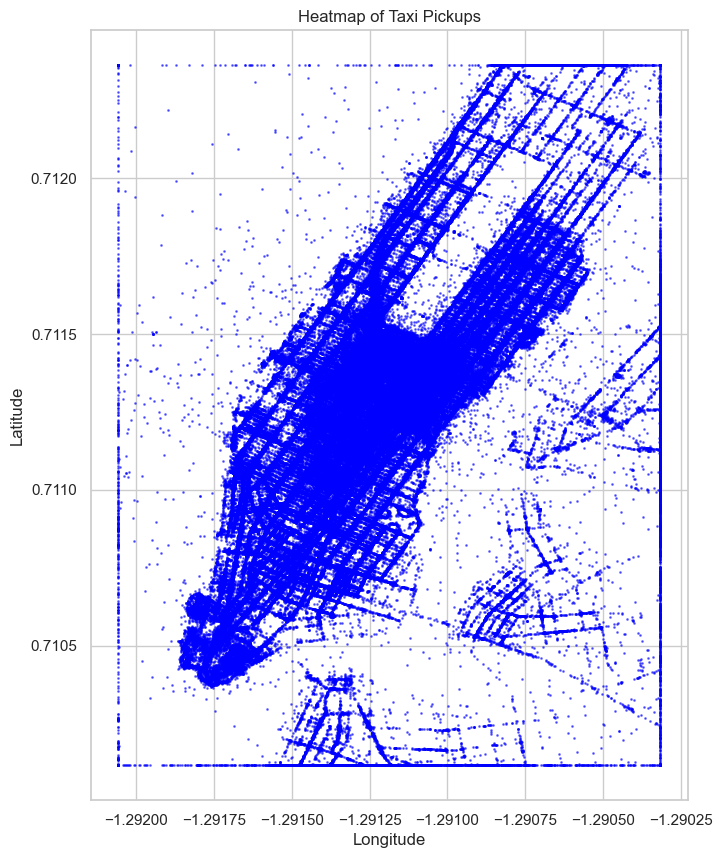

In [47]:

# Convert the longitude and latitude to a GeoDataFrame
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.pickup_longitude, data.pickup_latitude))

# Set the coordinate reference system to WGS84 (lat-long)
gdf.set_crs(epsg=4326, inplace=True)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize=1, color='blue', alpha=0.5)  # Adjust alpha for point transparency
plt.title('Heatmap of Taxi Pickups')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

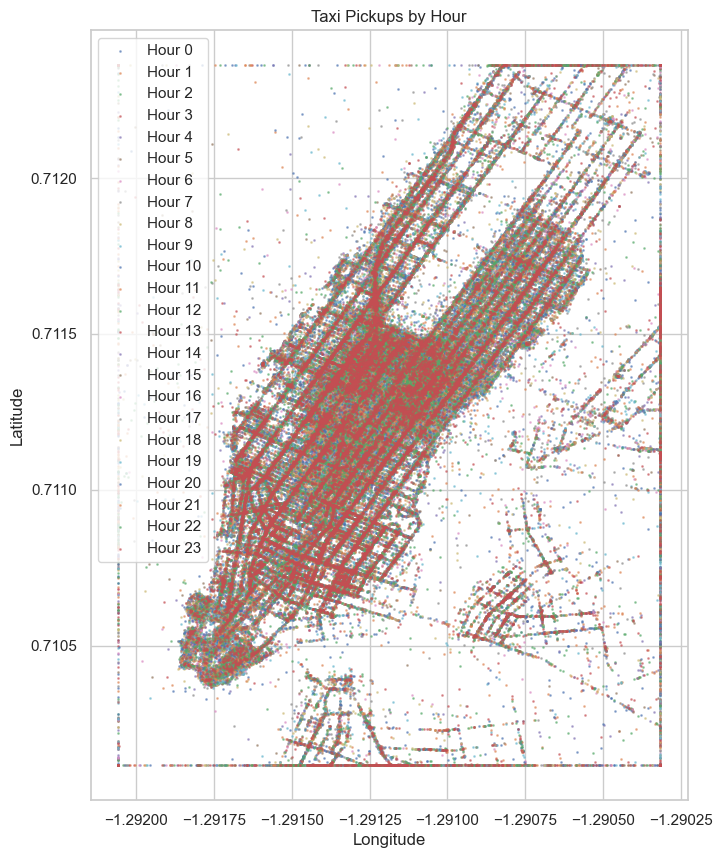

In [48]:
# Extract hour from the 'pickup_datetime' column
gdf['hour'] = pd.to_datetime(data['pickup_datetime']).dt.hour

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Use a loop to plot different hours with different colors
for hour in range(24):
    subset = gdf[gdf['hour'] == hour]
    subset.plot(ax=ax, markersize=1, label=f'Hour {hour}', alpha=0.5)

plt.title('Taxi Pickups by Hour')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.show()

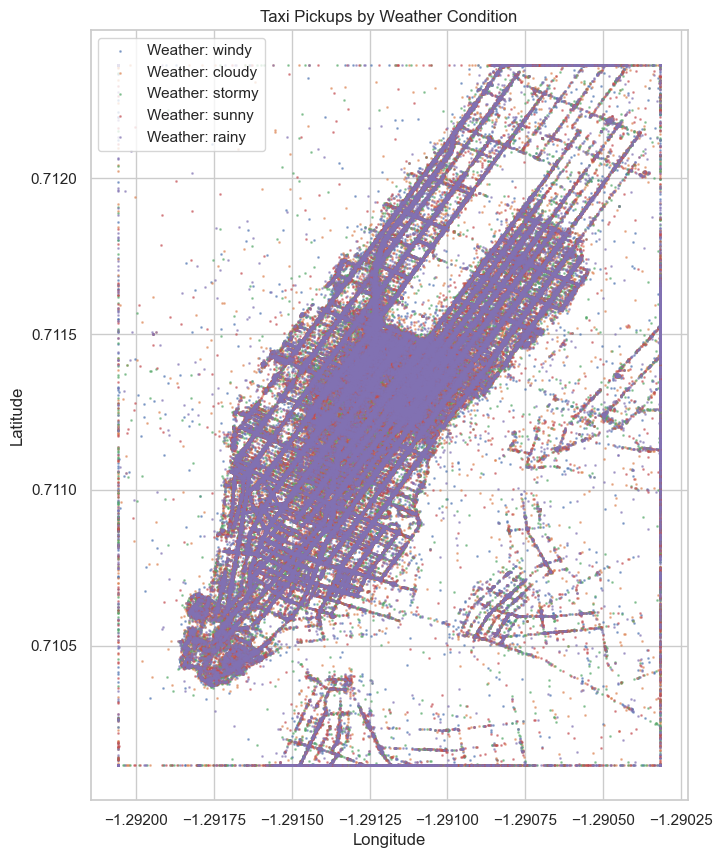

In [49]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Filter by different weather conditions and plot
weather_conditions = data['Weather'].unique()
for weather in weather_conditions:
    subset = gdf[gdf['Weather'] == weather]
    subset.plot(ax=ax, markersize=1, label=f'Weather: {weather}', alpha=0.5)

plt.title('Taxi Pickups by Weather Condition')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.show()

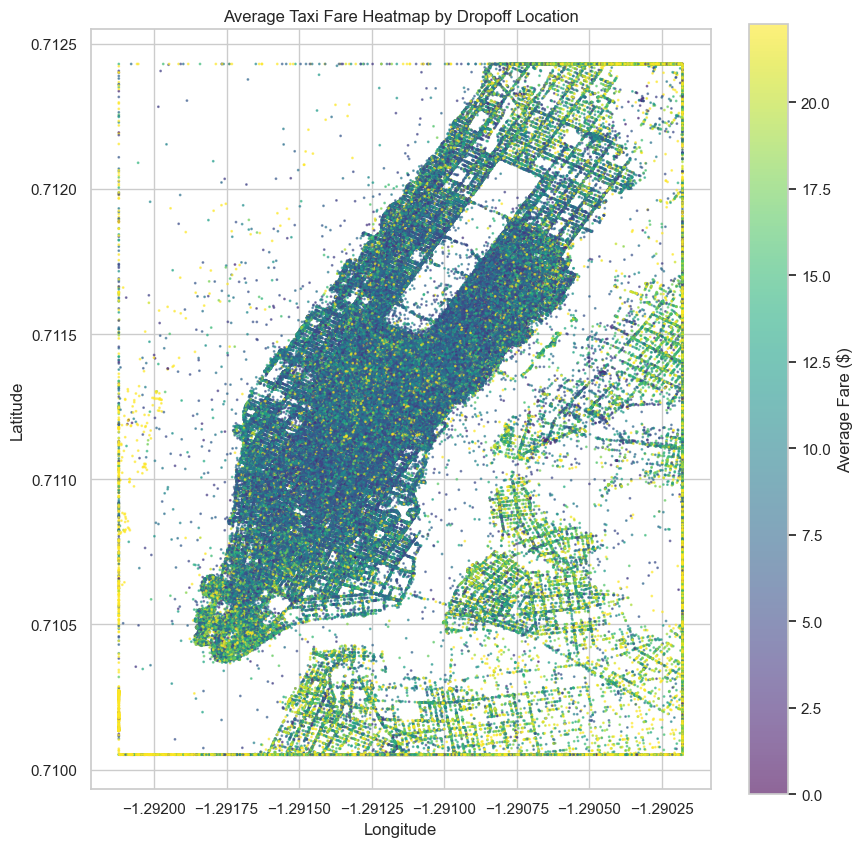

In [50]:
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.dropoff_longitude, data.dropoff_latitude))

# Calculate average fare per dropoff location
gdf['fare_per_location'] = gdf.groupby('geometry')['fare_amount'].transform('mean')

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
# Get the unique geometries and their associated fare_per_location
unique_gdf = gdf.drop_duplicates('geometry')
# Plot without legend and get the mappable object
mappable = unique_gdf.plot(ax=ax, column='fare_per_location', markersize=1, legend=False, cmap='viridis', alpha=0.6)

plt.title('Average Taxi Fare Heatmap by Dropoff Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)

# Adding colorbar using the mappable object
fig.colorbar(mappable.collections[0], ax=ax, label='Average Fare ($)')

plt.show()

In [51]:
from shapely.geometry import LineString
import folium

In [52]:

##Saved html file

# data['geometry'] = data.apply(lambda row: LineString([(row['pickup_longitude'], row['pickup_latitude']), 
#                                                       (row['dropoff_longitude'], row['dropoff_latitude'])]), axis=1)
# gdf_routes = gpd.GeoDataFrame(data, geometry='geometry')

# # Set coordinate system
# gdf_routes.set_crs(epsg=4326, inplace=True)

# # Create a base map
# map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# # Plot each route with a color based on traffic condition
# colors = {'Light Traffic': 'green', 'Moderate Traffic': 'orange', 'Congested Traffic': 'red'}
# for _, row in gdf_routes.iterrows():
#     folium.PolyLine(locations=[(row['pickup_latitude'], row['pickup_longitude']), 
#                                (row['dropoff_latitude'], row['dropoff_longitude'])],
#                     color=colors.get(row['Traffic Condition'], 'blue'),
#                     weight=2).add_to(map)

# # Display map
# map.save('NYC_Taxi_Routes.html')
# map